In [2]:
import os
import pickle
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
data_path = "../filtered_df/all_data"
files = os.listdir(data_path)
ids = [file.split(".")[0] for file in files]
files_path = [os.path.join(data_path, file) for file in files]

In [3]:
dfs = [pd.read_csv(path) for path in files_path]

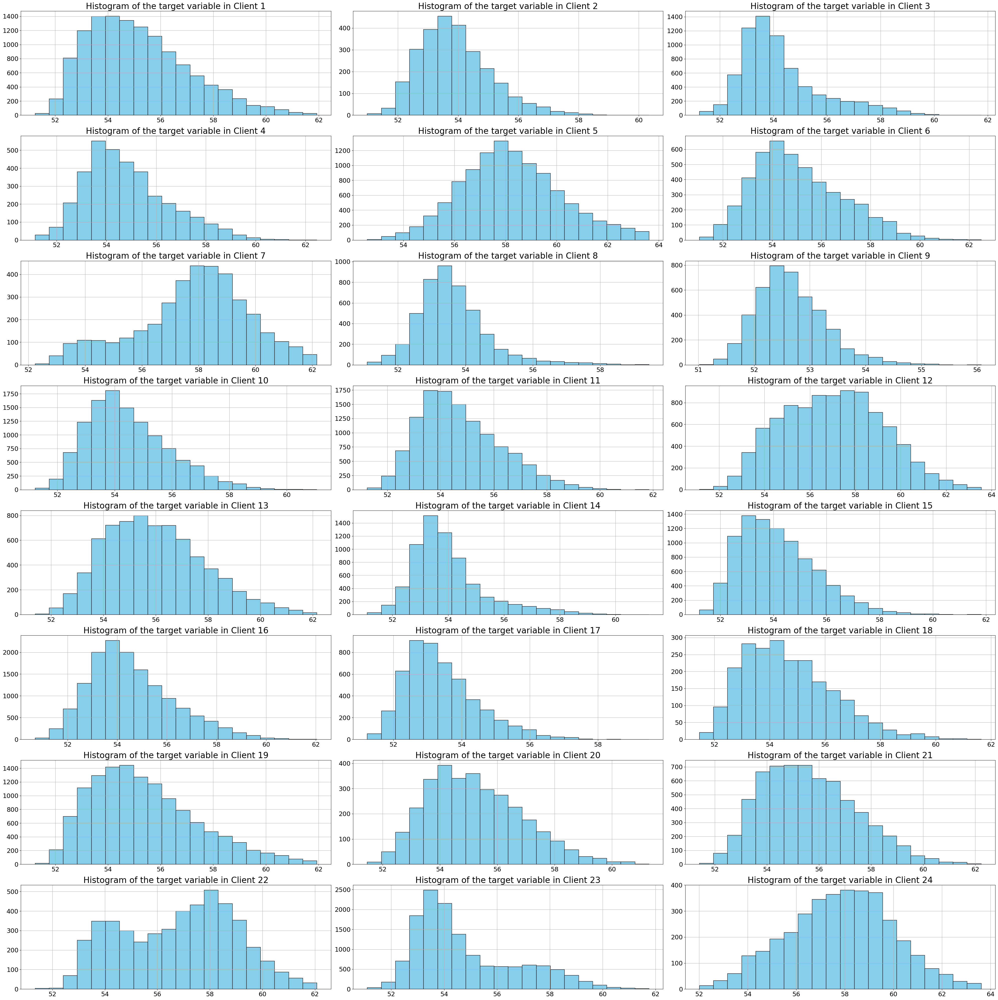

In [4]:
num_rows = len(dfs) // 3 + (len(dfs) % 3 > 0)

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, 3, figsize=(40, 40))

# Plot histograms for label column in each dataframe
for i, df in enumerate(dfs):
    label_column = df.columns[-1]  # Assuming label column is the last column
    ax = axes[i // 3, i % 3] if num_rows > 1 else axes[i % 3]
    df[label_column].hist(ax=ax, bins=20, color='skyblue', edgecolor='black')
    ax.set_title(f'Histogram of the target variable in Client {i+1}', fontsize=24)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18) 

# Adjust layout and show plot
plt.tight_layout()
save_location = "../plots/updated_distributions.png"
plt.savefig(save_location)
plt.show()

# Anderson Darling Test

In [5]:
from scipy import stats
for feature in list(dfs[0].columns):
    samples = [i[feature].values for i in dfs]
    res = stats.anderson_ksamp(samples)
    res.statistic, res.pvalue

    if res.pvalue > 0.01:
        print(feature)
        print(res.pvalue)

/var/folders/nc/qf87_4nn3qv8g_f3kl5wytb00000gn/T/ipykernel_10165/2101069694.py:4: UserWarning: p-value floored: true value smaller than 0.001. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  res = stats.anderson_ksamp(samples)
/var/folders/nc/qf87_4nn3qv8g_f3kl5wytb00000gn/T/ipykernel_10165/2101069694.py:4: UserWarning: p-value capped: true value larger than 0.25. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  res = stats.anderson_ksamp(samples)


eth1_rxdrop.s
0.25
irec6.s
0.010593235789677769
i022_intr.s
0.05424182966537065


# Clustering Visualization in Multidimentional Space

/Users/tharuka/anaconda3/envs/fedce/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tharuka/anaconda3/envs/fedce/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tharuka/anaconda3/envs/fedce/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tharuka/anaconda3/envs/fedce/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarni

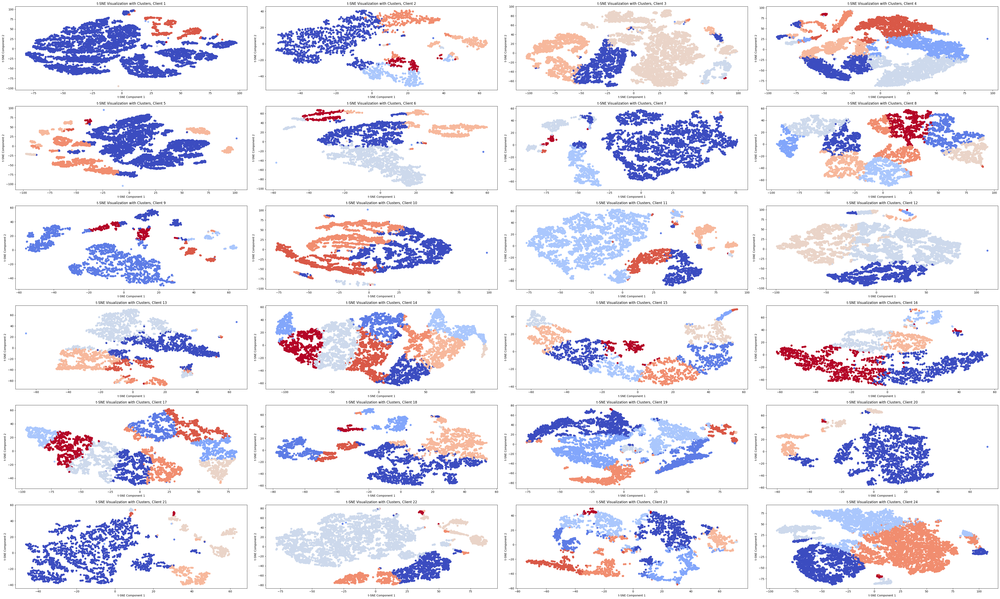

In [5]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Calculate number of rows for subplots
num_rows = len(dfs) // 4 + (len(dfs) % 4 > 0)

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(50, 30))

# Plot t-SNE visualization with cluster colors for each dataframe
for i, df in enumerate(dfs):
    ax = axes[i // 4, i % 4] if num_rows > 1 else axes[i % 4]
    ax.set_title(f't-SNE Visualization with Clusters, Client {i+1}')
    ax.set_xlabel('t-SNE Component 1')
    ax.set_ylabel('t-SNE Component 2')
    
    # Perform t-SNE dimensionality reduction
    tsne = TSNE(n_components=2, random_state=42)
    tsne_results = tsne.fit_transform(df)

    
    # Cluster features using KMeans
    kmeans = KMeans(n_clusters=10, random_state=42)  # You can adjust the number of clusters as needed
    cluster_labels = kmeans.fit_predict(df)

    # Plot t-SNE visualization with cluster colors
    ax.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='coolwarm')
    #ax.colorbar(label='Cluster')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

In [ ]:
def best_k(df):
    param_grid = {'n_clusters': range(1, 20)}
    kmeans = KMeans(n_init=20)
    grid_search = RandomizedSearchCV(kmeans, param_distributions=param_grid, n_iter=10, cv=5)
    grid_search.fit(df.iloc[:, :-1])
    best_kmeans = grid_search.best_estimator_
    optimal_k = best_kmeans.n_clusters
    print(optimal_k)
    return optimal_k

In [ ]:
optimal_ks = [best_k(df) for df in dfs]

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Calculate number of rows for subplots
num_rows = len(dfs) // 4 + (len(dfs) % 4 > 0)

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(50, 30))

# Plot t-SNE visualization with cluster colors for each dataframe
for i, df in enumerate(dfs):
    ax = axes[i // 4, i % 4] if num_rows > 1 else axes[i % 4]
    ax.set_title(f't-SNE Visualization with Clusters, Client {i+1}')
    ax.set_xlabel('t-SNE Component 1')
    ax.set_ylabel('t-SNE Component 2')
    
    # Perform t-SNE dimensionality reduction
    tsne = TSNE(n_components=2, random_state=42)
    tsne_results = tsne.fit_transform(df)


    # Plot t-SNE visualization with cluster colors
    ax.scatter(tsne_results[:, 0], tsne_results[:, 1], cmap='coolwarm')
    #ax.colorbar(label='Cluster')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

/var/folders/mm/mlcr8k8n51n66y25lmp08mrm0000gn/T/ipykernel_40275/2931764075.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm', 10)
/var/folders/mm/mlcr8k8n51n66y25lmp08mrm0000gn/T/ipykernel_40275/2931764075.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


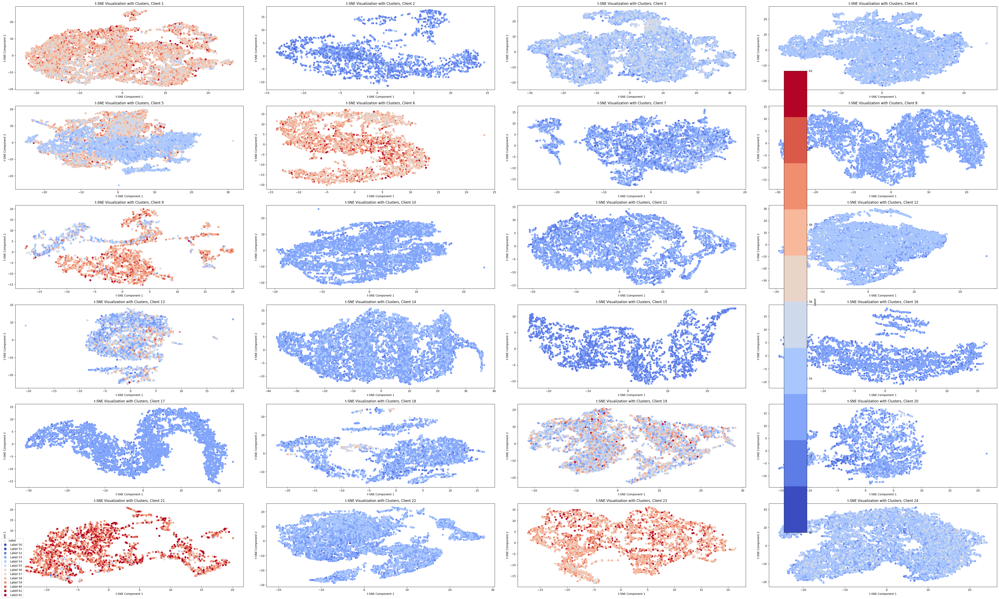

In [7]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Calculate number of rows for subplots
num_rows = len(dfs) // 4 + (len(dfs) % 4 > 0)

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(50, 30))

# Define color map and normalization
cmap = plt.cm.get_cmap('coolwarm', 10)
norm = Normalize(vmin=50, vmax=62)  # Define min_label_value and max_label_value accordingly
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Plot t-SNE visualization with cluster colors for each dataframe
for i, df in enumerate(dfs):
    ax = axes[i // 4, i % 4] if num_rows > 1 else axes[i % 4]
    ax.set_title(f't-SNE Visualization with Clusters, Client {i+1}')
    ax.set_xlabel('t-SNE Component 1')
    ax.set_ylabel('t-SNE Component 2')

    # Perform t-SNE dimensionality reduction
    tsne = TSNE(n_components=3, random_state=42)
    tsne_results = tsne.fit_transform(df.drop('label', axis=1))

    # Get label column for color coding
    label_column = df['label']

    # Plot t-SNE visualization with color-coded labels
    sc = ax.scatter(tsne_results[:, 0], tsne_results[:, 1], c=label_column, cmap=cmap, norm=norm)

# Add a common legend
fig.colorbar(sm, ax=axes, label='Label')
fig.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=f'Label {label}') for label, color in zip(range(50, 62 + 1), cmap(norm(range(50, 62 + 1))))], title='Label', loc='lower left')

# Adjust layout and show plot
plt.tight_layout()
plt.show()